# **Checklist**

o que falta fazer: 

- construir gráficos para a análise desses dados
- ver se precisa tirar algum outlier (dados discrepantes ou inconsistentes) -> *acho que não precisa pq o outlier que tem é justamente no preço e nós não vamos usar essa coluna*
- transformação dos dados usando algum encoder (transformar categóricos em numéricos)
- dividir em treino e teste (em porcentagem, ex: 20 pra teste e 80 pra treino)
- previsão do preço
- regressão linear
- gráficos sobre os ultimos 2
- finalizar com comentários

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd
import csv
import plotly.express as px

In [13]:
df = pd.read_csv("/content/AB_NYC_2019.csv")
df

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,NaN,NaN,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,NaN,NaN,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,NaN,NaN,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,NaN,NaN,6,2


In [ ]:
df.sample(2)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
13495,10101135,Room Near JFK Twin Beds,47621202,Dona,Queens,Jamaica,40.66939,-73.76975,Private room,47,1,576,2019-06-27,13.40,2,173
30186,23292216,Lower East Side Oasis,173406651,Dan,Manhattan,Lower East Side,40.71960,-73.98133,Entire home/apt,300,3,30,2019-07-02,1.77,2,182


In [ ]:
df.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [ ]:
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

# Parte 1

**iremos fazer a previsão do preço a partir dos restantes dos dados**

previsão: price

colunas de base: 
  - neighbourhood_group, room_type *(categoricos)*
  - minimum_nights, number_of_reviews, reviews_per_month, availability_365 *(numéricos)*


  os dados categóricos teremos que transformar para numéricos
  não sei se todas essas colunas vão ser relevantes..falta analisar isso

# --- Transformação dos Dados ---

In [ ]:
df.count()

id                                48858
name                              48858
host_id                           48858
host_name                         48858
neighbourhood_group               48858
neighbourhood                     48858
latitude                          48858
longitude                         48858
room_type                         48858
price                             48858
minimum_nights                    48858
number_of_reviews                 48858
last_review                       38821
reviews_per_month                 48858
calculated_host_listings_count    48858
availability_365                  48858
dtype: int64

Tirando os dados NaN do last_review para diminuir a quantidade de bairros (tentativa)

In [19]:
df.dropna(subset = ['last_review'], inplace = True)

In [20]:
df.count()

id                                38843
name                              38837
host_id                           38843
host_name                         38827
neighbourhood_group               38843
neighbourhood                     38843
latitude                          38843
longitude                         38843
room_type                         38843
price                             38843
minimum_nights                    38843
number_of_reviews                 38843
last_review                       38843
reviews_per_month                 38843
calculated_host_listings_count    38843
availability_365                  38843
dtype: int64

In [21]:
df.dropna(subset = ['host_name'], inplace = True)

In [22]:
df.count()

id                                38827
name                              38821
host_id                           38827
host_name                         38827
neighbourhood_group               38827
neighbourhood                     38827
latitude                          38827
longitude                         38827
room_type                         38827
price                             38827
minimum_nights                    38827
number_of_reviews                 38827
last_review                       38827
reviews_per_month                 38827
calculated_host_listings_count    38827
availability_365                  38827
dtype: int64

In [23]:
df.dropna(subset = ['name'], inplace = True)

In [24]:
df.count()

id                                38821
name                              38821
host_id                           38821
host_name                         38821
neighbourhood_group               38821
neighbourhood                     38821
latitude                          38821
longitude                         38821
room_type                         38821
price                             38821
minimum_nights                    38821
number_of_reviews                 38821
last_review                       38821
reviews_per_month                 38821
calculated_host_listings_count    38821
availability_365                  38821
dtype: int64

In [47]:
df['neighbourhood_group'].nunique()

5

In [45]:
len(np.unique(df['neighbourhood_group']))

5

In [48]:
df['room_type'].nunique()

3

--- OneHotEncoder ---

In [49]:
df_filtro = df[['neighbourhood_group', 'room_type', 'minimum_nights', 'number_of_reviews', 'reviews_per_month','availability_365', 'price']]
df_filtro

,neighbourhood_group,room_type,minimum_nights,number_of_reviews,reviews_per_month,availability_365,price
0,Brooklyn,Private room,1,9,0.21,365,149
1,Manhattan,Entire home/apt,1,45,0.38,355,225
3,Brooklyn,Entire home/apt,1,270,4.64,194,89
4,Manhattan,Entire home/apt,10,9,0.10,0,80
5,Manhattan,Entire home/apt,3,74,0.59,129,200
...,...,...,...,...,...,...,...
48782,Manhattan,Private room,1,1,1.00,147,129
48790,Queens,Private room,1,1,1.00,339,45
48799,Staten Island,Private room,1,1,1.00,87,235
48805,Bronx,Entire home/apt,1,2,2.00,40,100


In [50]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

In [55]:
ohe = (ColumnTransformer(
    transformers = [('OneHot', OneHotEncoder(), [0, 1])], # neighbourhood_group e room_type = dados categoricos
    remainder = 'passthrough'
))

In [59]:
# usando o onehotencoder

X_df = ohe.fit_transform(X_df).toarray()

AttributeError: ignored

--- Label Encoder --- 

In [88]:
X_df = df_filtro.iloc[:, 0:6].values
X_df

array([['Brooklyn', 'Private room', 1, 9, 0.21, 365],
       ['Manhattan', 'Entire home/apt', 1, 45, 0.38, 355],
       ['Brooklyn', 'Entire home/apt', 1, 270, 4.64, 194],
       ...,
       ['Staten Island', 'Private room', 1, 1, 1.0, 87],
       ['Bronx', 'Entire home/apt', 1, 2, 2.0, 40],
       ['Brooklyn', 'Private room', 1, 1, 1.0, 1]], dtype=object)

In [89]:
X_df[0]

array(['Brooklyn', 'Private room', 1, 9, 0.21, 365], dtype=object)

In [90]:
y_df = df_filtro.iloc[:, 6].values
y_df

array([149, 225,  89, ..., 235, 100,  30])

In [91]:
y_df[0]

149

In [92]:
from sklearn.preprocessing import LabelEncoder
X_neighbourhood_group = LabelEncoder()
X_room_type = LabelEncoder()

In [93]:
X_df[:, 0] = X_neighbourhood_group.fit_transform(X_df[:, 0])
X_df[:, 1] = X_room_type.fit_transform(X_df[:, 1])

X_df

array([[1, 1, 1, 9, 0.21, 365],
       [2, 0, 1, 45, 0.38, 355],
       [1, 0, 1, 270, 4.64, 194],
       ...,
       [4, 1, 1, 1, 1.0, 87],
       [0, 0, 1, 2, 2.0, 40],
       [1, 1, 1, 1, 1.0, 1]], dtype=object)

In [94]:
X_df[0]

array([1, 1, 1, 9, 0.21, 365], dtype=object)

**PERGUNTAR PRA PROFESSORA SE PRECISA PADRONIZAR OS DADOS DEPOIS DA TRANSFORMAÇÃO DO DATAFRAME PADRÃO PARA O DATAFRAME AIRBNB**

In [101]:
column_names = ['neighbourhood_group', 'room_type', 'minimum_nights', 'number_of_reviews', 'reviews_per_month','availability_365']
airbnb = pd.DataFrame(X_df, columns = column_names)

In [103]:
airbnb

,neighbourhood_group,room_type,minimum_nights,number_of_reviews,reviews_per_month,availability_365
0,1,1,1,9,0.21,365
1,2,0,1,45,0.38,355
2,1,0,1,270,4.64,194
3,2,0,10,9,0.1,0
4,2,0,3,74,0.59,129
...,...,...,...,...,...,...
38816,2,1,1,1,1,147
38817,3,1,1,1,1,339
38818,4,1,1,1,1,87
38819,0,0,1,2,2,40


In [97]:
airbnb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38821 entries, 0 to 38820
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   0       38821 non-null  object
 1   1       38821 non-null  object
 2   2       38821 non-null  object
 3   3       38821 non-null  object
 4   4       38821 non-null  object
 5   5       38821 non-null  object
dtypes: object(6)
memory usage: 1.8+ MB


--- OneHotEncoder ---

In [65]:
#from sklearn.preprocessing import OneHotEncoder
#from sklearn.compose import ColumnTransformer

In [76]:
#ohe = (ColumnTransformer(
    #transformers = [('OneHot', OneHotEncoder(), [0, 1])], # neighbourhood_group e room_type
    #remainder = 'passthrough'
#))

In [ ]:
# usando o onehotencoder

#X_df = ohe.fit_transform(X_df).toarray()

Treino e Teste

In [ ]:
# train e test
#from sklearn.model_selection import train_test_split

#X_train, X_test, Y_train, Y_test = train_test_split(X_df, y_df, test_size=0.20, random_state=1)

In [ ]:
# padronizar os dados

#from sklearn.preprocessing import StandardScaler
#df_scaler = StandardScaler()
#X_train = df_scaler.fit_transform(X_train)
#X_test = df_scaler.transform(X_test)

In [ ]:
#X_train

array([[ 0.44413127, -1.04968028,  0.9081576 , ..., -0.57080985,
        -0.18488573,  1.55982201],
       [ 0.44413127,  1.43767401, -0.92598946, ..., -0.46474141,
        -0.18488573, -0.8550254 ],
       [-0.91674321, -1.12240994, -0.92598946, ...,  5.33158718,
        -0.18488573, -0.62649094],
       ...,
       [-0.91674321, -1.36969078, -0.92598946, ...,  0.13423334,
        -0.18488573,  1.36175881],
       [-0.91674321, -1.36969078,  0.9081576 , ...,  0.30893431,
        -0.1241394 , -0.66458002],
       [ 1.80500576,  0.1430861 , -0.92598946, ...,  0.70825081,
        -0.18488573,  0.07434805]])

In [ ]:
# salvar esse Encoder pra não ter que fazer isso sempre:

#import pickle
#with open('price_prediction.pkl', 'wb') as f:
  #pickle.dump([X_train, X_test, Y_train, Y_test], f)

**4**

Perform a multi-variate analysis of the predictors. Specifically, you must perform a
principal components analysis of the predictors, retain only the first two principal
components (those associated with the two largest eigenvalues) and plot the scatter
plot of the projected observations.

Site de inspiração: https://towardsdatascience.com/pca-using-python-scikit-learn-e653f8989e60

https://leandrocruvinel.medium.com/pca-na-mão-e-no-python-d559e9c8f053


Primeiro é necessário subtrair a média pois a pca é bastante sensível a escala


In [ ]:
df_filtro

,neighbourhood_group,neighbourhood,room_type,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,price
0,Brooklyn,Kensington,Private room,1,9,0.21,6,365,149
1,Manhattan,Midtown,Entire home/apt,1,45,0.38,2,355,225
2,Manhattan,Harlem,Private room,3,0,0.00,1,365,150
3,Brooklyn,Clinton Hill,Entire home/apt,1,270,4.64,1,194,89
4,Manhattan,East Harlem,Entire home/apt,10,9,0.10,1,0,80
...,...,...,...,...,...,...,...,...,...
48890,Brooklyn,Bedford-Stuyvesant,Private room,2,0,0.00,2,9,70
48891,Brooklyn,Bushwick,Private room,4,0,0.00,2,36,40
48892,Manhattan,Harlem,Entire home/apt,10,0,0.00,1,27,115
48893,Manhattan,Hell's Kitchen,Shared room,1,0,0.00,6,2,55


In [ ]:
df_filtro = df_filtro - df_filtro.mean()
df_filtro

,availability_365,calculated_host_listings_count,minimum_nights,neighbourhood,neighbourhood_group,number_of_reviews,price,reviews_per_month,room_type
0,252.198575,-1.148369,-6.012444,NaN,NaN,-14.273098,-3.740309,-0.881124,NaN
1,242.198575,-5.148369,-6.012444,NaN,NaN,21.726902,72.259691,-0.711124,NaN
2,252.198575,-6.148369,-4.012444,NaN,NaN,-23.273098,-2.740309,-1.091124,NaN
3,81.198575,-6.148369,-6.012444,NaN,NaN,246.726902,-63.740309,3.548876,NaN
4,-112.801425,-6.148369,2.987556,NaN,NaN,-14.273098,-72.740309,-0.991124,NaN
...,...,...,...,...,...,...,...,...,...
48890,-103.801425,-5.148369,-5.012444,NaN,NaN,-23.273098,-82.740309,-1.091124,NaN
48891,-76.801425,-5.148369,-3.012444,NaN,NaN,-23.273098,-112.740309,-1.091124,NaN
48892,-85.801425,-6.148369,2.987556,NaN,NaN,-23.273098,-37.740309,-1.091124,NaN
48893,-110.801425,-1.148369,-6.012444,NaN,NaN,-23.273098,-97.740309,-1.091124,NaN


Agora devemos calcular a matrix de covariancia

In [ ]:
#covMatrix = np.cov(df_filtro)
covMatrix

NameError: ignored

**Question:**

Are the data well (or better) separated? What predictors show a high degree of overlapand thus are harder to separate?

Better separeted = desejamos tirar preditores que possuem correlações, dados melhor separados significa dados com pouca correlação, para ter o máximo de informação com a menor quantidade de dados

**R:**



# --- Data Analysis --- 

1. Define the goal of your goal and identify the output Y of your predictive model.
Describe your data and their features in terms of number of observations N, number
of predictor variables D. Make sure that predictors are numerical, not categorical.

**R:**

Objetivo: prever o preço a partir das outras colunas do nosso dataset;

Descrição: São 48895 análises (antes da limpeza dos dados), iremos utilizar a coluna price para as previsões e as colunas neighbourhood_group, neighbourhood room_type (categoricos) e minimum_nights, number_of_reviews, reviews_per_month, calculated_host_listings_count, availability_365 (numéricos), as quais iremos utilizar a transformação para categóricos virarem numéricos, totalizando 8 colunas de previsores.

2. Perform a mono-variate analysis of each of the D predictors. Specifically, you must
plot their histogram, calculate their mean µd, standard deviation σd and skewness γd,
with d = 1, . . . , D, using all the N observations

**R:**

Achando o mean e o deviation>

In [99]:
airbnb.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,3.882100e+04,3.882100e+04,38821.000000,38821.000000,38821.000000,38821.000000,38821.000000,38821.000000,38821.000000,38821.000000
mean,1.810081e+07,6.424582e+07,40.728129,-73.951149,142.332526,5.869220,29.290255,1.373229,5.166611,114.886299
std,1.069372e+07,7.589752e+07,0.054991,0.046693,196.994756,17.389026,48.182900,1.680328,26.302954,129.529950
min,2.539000e+03,2.438000e+03,40.506410,-74.244420,0.000000,1.000000,1.000000,0.010000,1.000000,0.000000
25%,8.721444e+06,7.029525e+06,40.688640,-73.982460,69.000000,1.000000,3.000000,0.190000,1.000000,0.000000
50%,1.887286e+07,2.837092e+07,40.721710,-73.954810,101.000000,2.000000,9.000000,0.720000,1.000000,55.000000
75%,2.756746e+07,1.018905e+08,40.762990,-73.935020,170.000000,4.000000,33.000000,2.020000,2.000000,229.000000
max,3.645581e+07,2.738417e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [104]:
airbnb.describe()

,neighbourhood_group,room_type,minimum_nights,number_of_reviews,reviews_per_month,availability_365
count,38821,38821,38821,38821,38821.00,38821
unique,5,3,89,393,937.00,366
top,2,0,2,1,0.02,0
freq,16621,20321,10300,5239,914.00,12675


In [105]:
airbnb['minimum_nights'].mean()

5.869220267381056

Descobrindo o skewness

In [ ]:
airbnb.skew(axis = 0)

id                                -0.090257
host_id                            1.206214
latitude                           0.237167
longitude                          1.284210
price                             19.118939
minimum_nights                    21.827275
number_of_reviews                  3.690635
reviews_per_month                  3.130189
calculated_host_listings_count     7.933174
availability_365                   0.763408
dtype: float64

Pegando um valor que é necessário pra questão

In [ ]:
airbnb['reviews_per_month'].mean()

1.3732214298586884

In [ ]:
airbnb['reviews_per_month'].std()

1.6804419952744627

In [ ]:
airbnb['calculated_host_listings_count'].mean()

7.143982002249719

Plotando os histogramas dos previsores:

In [ ]:
plt.style.use('seaborn-darkgrid')

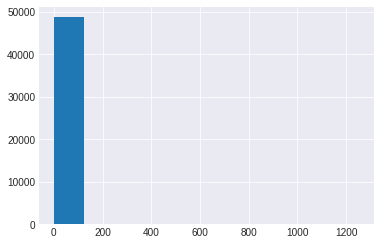

In [ ]:
plt.hist(x = airbnb['minimum_nights']);

In [ ]:
# esse grafico aqui é mais detalhado do que o hist acima ("mais aberto")

plot = px.histogram(airbnb, x = "minimum_nights")
plot.show()

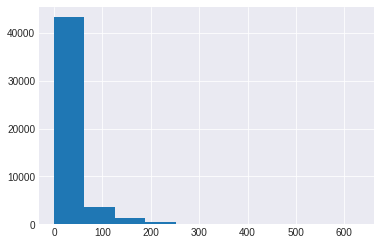

In [ ]:
plt.hist(x = airbnb['number_of_reviews']);

In [ ]:
plot = px.histogram(airbnb, x = 'number_of_reviews')
plot.show()

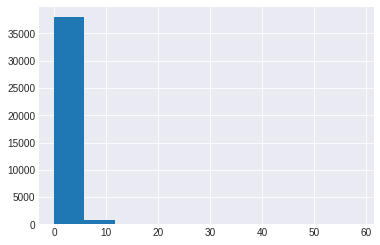

In [ ]:
plt.hist(x = airbnb['reviews_per_month']);

In [ ]:
plot = px.histogram(airbnb, x = 'reviews_per_month')
plot.show()

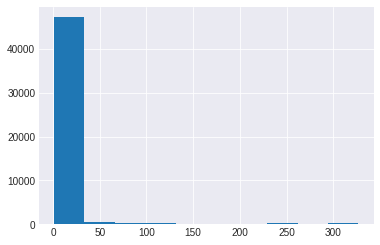

In [ ]:
plt.hist(x = airbnb['calculated_host_listings_count']);

In [ ]:
plot = px.histogram(airbnb, x = 'calculated_host_listings_count')
plot.show()

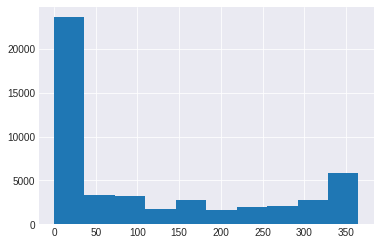

In [ ]:
plt.hist(x = airbnb['availability_365']);

In [ ]:
plot = px.histogram(airbnb , x= 'availability_365')
plot.show()

3. Perform a bi-variate analysis of the predictors. Specifically, you must plot the scatter
plots between all pairs of predictors. Investigate the existence of potential relationships
between pairs of predictors and the presence of potential outliers

previsores: minimum_nights, number_of_reviews, reviews_per_month, calculated_host_listings_count, availability_365

In [ ]:
plot = px.scatter_matrix(airbnb, dimensions= ['minimum_nights', 'number_of_reviews'], color = 'host_id')
plot.show()

In [ ]:
plot = px.scatter_matrix(airbnb, dimensions= ['minimum_nights', 'reviews_per_month'], color = 'host_id')
plot.show()

In [ ]:
plot = px.scatter_matrix(airbnb, dimensions= ['minimum_nights', 'calculated_host_listings_count'], color = 'host_id')
plot.show()

In [ ]:
plot = px.scatter_matrix(airbnb, dimensions= ['minimum_nights', 'availability_365'], color = 'host_id')
plot.show()

In [ ]:
plot = px.scatter_matrix(airbnb, dimensions= ['number_of_reviews', 'reviews_per_month'], color = 'host_id')
plot.show()

In [ ]:
plot = px.scatter_matrix(airbnb, dimensions= ['number_of_reviews', 'calculated_host_listings_count'], color = 'host_id')
plot.show()

In [ ]:
plot = px.scatter_matrix(airbnb, dimensions= ['number_of_reviews', 'availability_365'], color = 'host_id')
plot.show()

In [ ]:
plot = px.scatter_matrix(airbnb, dimensions= ['reviews_per_month', 'calculated_host_listings_count'], color = 'host_id')
plot.show()

In [ ]:
plot = px.scatter_matrix(airbnb, dimensions= ['reviews_per_month', 'availability_365'], color = 'host_id')
plot.show()

In [ ]:
plot = px.scatter_matrix(airbnb, dimensions= ['calculated_host_listings_count', 'availability_365'], color = 'host_id')
plot.show()

**3.2**

Are there any relevant relationships between pairs of predictors? If yes, are these relationships
linear? Quantify linear dependence between predictors using pair-wise correlation
coefficients $\rho d_1, \rho d_j $ , with di; dj = 1,...,D. Either tabulate the correlation coefficients as a
correlation matrix, or show the matrix as an image. Comment on the results.


**R:** 

Sim, notamos que existem relações entre diversos preditores, como exemplo, entre numeros minimo de noites e numeros de reviews, numero de reviews e numero de reviews mês.



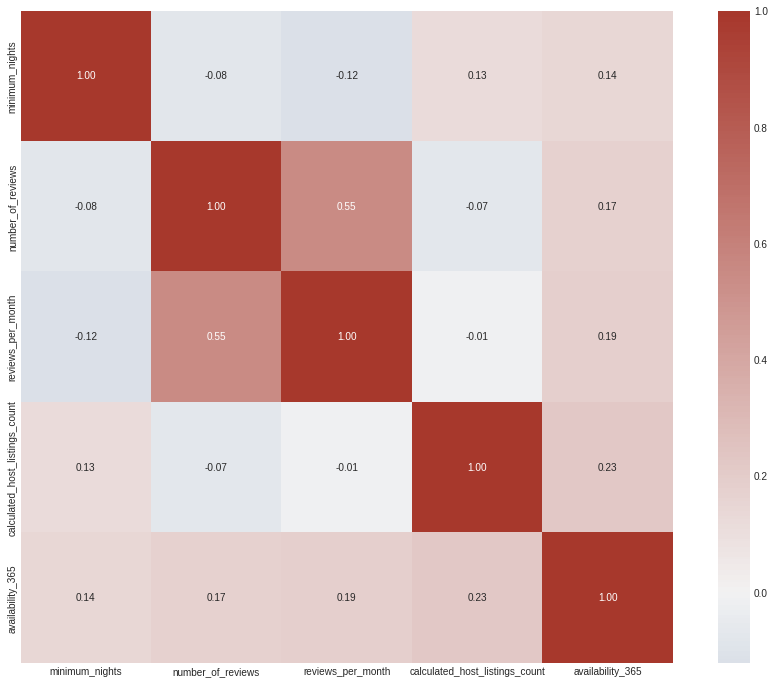

In [ ]:
df_aux = df[['minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']]

matrix = df_aux.corr(method ='pearson')

plt.figure(figsize=(16,12))

cmap = sns.diverging_palette(250, 15, s=75, l=40, n=9, center="light", as_cmap=True)

_ = sns.heatmap(matrix, center=0, annot=True, fmt='.2f', square=True, cmap=cmap)

Vemos que existe uma relação moderada entre número de reviews por mês e número de reviews 0.3 $\leq$ |r| $<$0.7 e as outras relações são fracas 0.0 $\leq$ |r| $<$0.3

# --- Limpeza dos Dados ---

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [ ]:
# checagem de valores nulos no df
df.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [ ]:
# retirando os valores nulos para a coluna 'name'

df.dropna(subset = ['name'], inplace = True) # o inplace é pra garantir que o df atualize os dados substituídos
df.isnull().sum()

id                                    0
name                                  0
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10042
reviews_per_month                 10042
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [ ]:
# retirando os valores nulos para a coluna 'host_name'

df.dropna(subset = ['host_name'], inplace = True)
df.isnull().sum()

id                                    0
name                                  0
host_id                               0
host_name                             0
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10037
reviews_per_month                 10037
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [ ]:
# análise dos valores nulos para number_of_reviews
df.loc[df['number_of_reviews'] == 0].head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
19,7750,Huge 2 BR Upper East Cental Park,17985,Sing,Manhattan,East Harlem,40.79685,-73.94872,Entire home/apt,190,7,0,NaN,NaN,2,249
26,8700,Magnifique Suite au N de Manhattan - vue Cloitres,26394,Claude & Sophie,Manhattan,Inwood,40.86754,-73.92639,Private room,80,4,0,NaN,NaN,1,0
36,11452,Clean and Quiet in Brooklyn,7355,Vt,Brooklyn,Bedford-Stuyvesant,40.68876,-73.94312,Private room,35,60,0,NaN,NaN,1,365
38,11943,Country space in the city,45445,Harriet,Brooklyn,Flatbush,40.63702,-73.96327,Private room,150,1,0,NaN,NaN,1,365


In [ ]:
# substituindo os valores NaN da coluna reviews_per_month para 0

df['reviews_per_month'] = df['reviews_per_month'].fillna(0.0)

In [ ]:
# fazendo a checagem apos a limpeza

df.isnull().sum()

id                                    0
name                                  0
host_id                               0
host_name                             0
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10037
reviews_per_month                     0
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [ ]:
# tirando valores duplicados

df.drop_duplicates()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,0.00,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,NaN,0.00,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,NaN,0.00,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,NaN,0.00,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,NaN,0.00,6,2


In [ ]:
# contagem final dos dados apos a limpeza

df

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,0.00,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,NaN,0.00,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,NaN,0.00,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,NaN,0.00,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,NaN,0.00,6,2


In [ ]:
df.info() # last_review não precisa resolver o problema da coluna pq nao iremos usar na previsão

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48858 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48858 non-null  int64  
 1   name                            48858 non-null  object 
 2   host_id                         48858 non-null  int64  
 3   host_name                       48858 non-null  object 
 4   neighbourhood_group             48858 non-null  object 
 5   neighbourhood                   48858 non-null  object 
 6   latitude                        48858 non-null  float64
 7   longitude                       48858 non-null  float64
 8   room_type                       48858 non-null  object 
 9   price                           48858 non-null  int64  
 10  minimum_nights                  48858 non-null  int64  
 11  number_of_reviews               48858 non-null  int64  
 12  last_review                     

# Linear Regression